In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import PIL

In [14]:

def img_is_color(img):

    if len(img.shape) == 3:
        # Check the color channels to see if they're all the same.
        c1, c2, c3 = img[:, : , 0], img[:, :, 1], img[:, :, 2]
        if (c1 == c2).all() and (c2 == c3).all():
            return True

    return False


def show_image_list(list_images, list_titles=None, list_cmaps=None, grid=True, num_cols=2, figsize=(20, 10), title_fontsize=30):
    '''
    Shows a grid of images, where each image is a Numpy array. The images can be either
    RGB or grayscale.

    Parameters:
    ----------
    images: list
        List of the images to be displayed.
    list_titles: list or None
        Optional list of titles to be shown for each image.
    list_cmaps: list or None
        Optional list of cmap values for each image. If None, then cmap will be
        automatically inferred.
    grid: boolean
        If True, show a grid over each image
    num_cols: int
        Number of columns to show.
    figsize: tuple of width, height
        Value to be passed to pyplot.figure()
    title_fontsize: int
        Value to be passed to set_title().
    '''

    assert isinstance(list_images, list)
    assert len(list_images) > 0
    assert isinstance(list_images[0], np.ndarray)

    if list_titles is not None:
        assert isinstance(list_titles, list)
        assert len(list_images) == len(list_titles), '%d imgs != %d titles' % (len(list_images), len(list_titles))

    if list_cmaps is not None:
        assert isinstance(list_cmaps, list)
        assert len(list_images) == len(list_cmaps), '%d imgs != %d cmaps' % (len(list_images), len(list_cmaps))

    num_images  = len(list_images)
    num_cols    = min(num_images, num_cols)
    num_rows    = int(num_images / num_cols) + (1 if num_images % num_cols != 0 else 0)

    # Create a grid of subplots.
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    
    # Create list of axes for easy iteration.
    if isinstance(axes, np.ndarray):
        list_axes = list(axes.flat)
    else:
        list_axes = [axes]

    for i in range(num_images):

        img    = list_images[i]
        title  = list_titles[i] if list_titles is not None else 'Image %d' % (i)
        cmap   = list_cmaps[i] if list_cmaps is not None else (None if img_is_color(img) else 'gray')
        
        list_axes[i].imshow(img, cmap=cmap)
        list_axes[i].set_title(title, fontsize=title_fontsize) 
        list_axes[i].grid(grid)

    for i in range(num_images, len(list_axes)):
        list_axes[i].set_visible(False)

    fig.tight_layout()
    _ = plt.show()


In [21]:
# Model 1 has 52
# Model 2 has 42
# Model 3 has 29
# Model 4 has 24
# Total Images checked: 229
model1accuracy = (229-52) / 229
model2accuracy = (229-42) / 229
model3accuracy = (229-29) / 229
model4accuracy = (229-24) / 229
print("Model 1: " + str(model1accuracy) + "\tModel 2: " + str(model2accuracy) + "\tModel 3: " + str(model3accuracy) + "\tModel 4: " + str(model4accuracy))

Model 1: 0.7729257641921398	Model 2: 0.8165938864628821	Model 3: 0.8733624454148472	Model 4: 0.8951965065502183


<Figure size 1152x360 with 0 Axes>

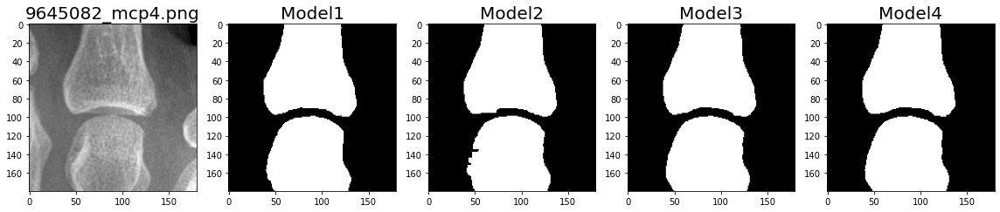

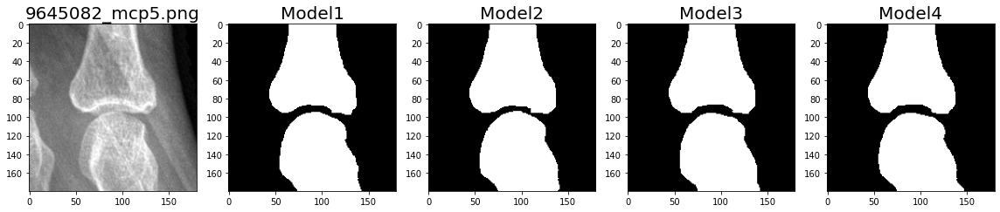

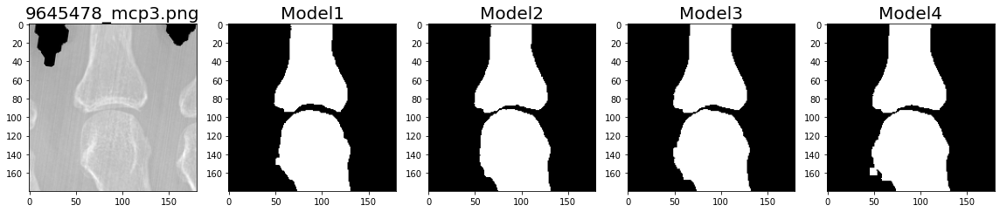

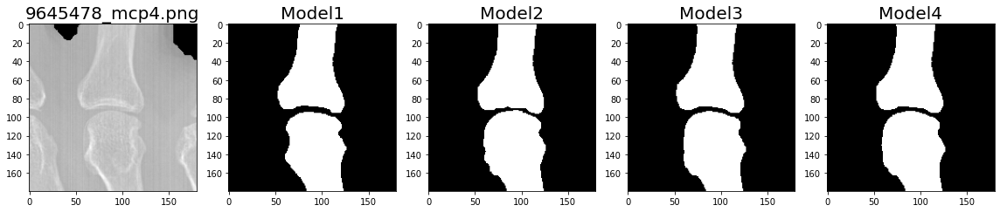

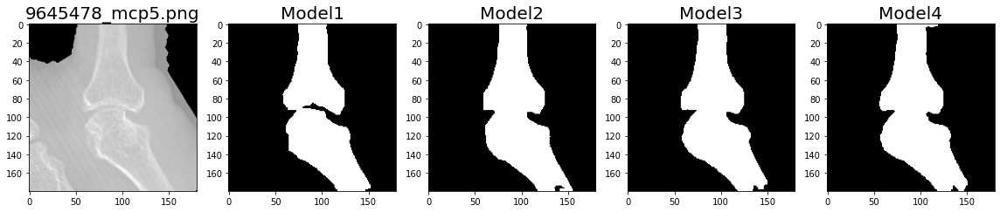

...

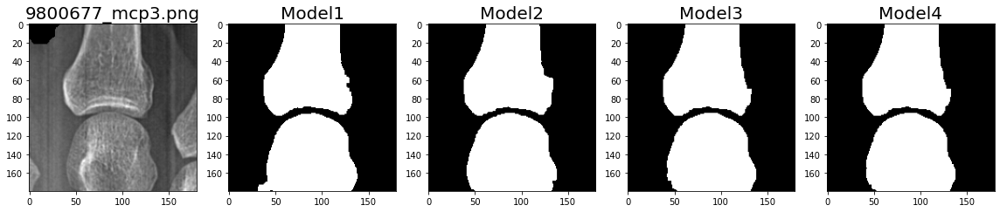

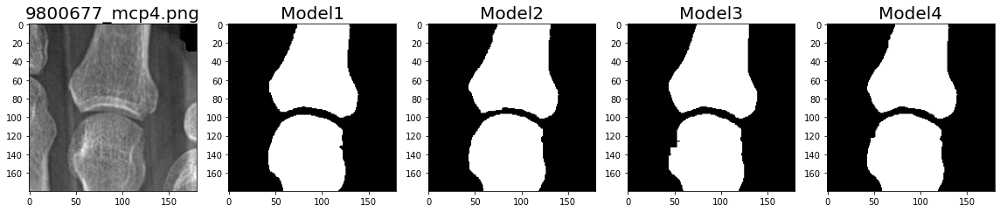

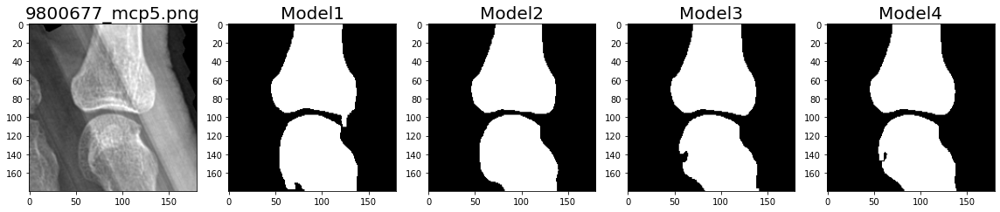

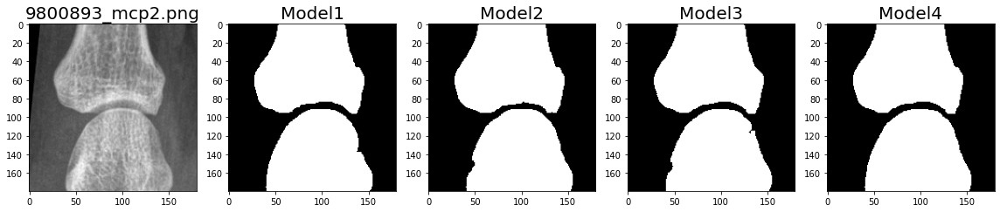

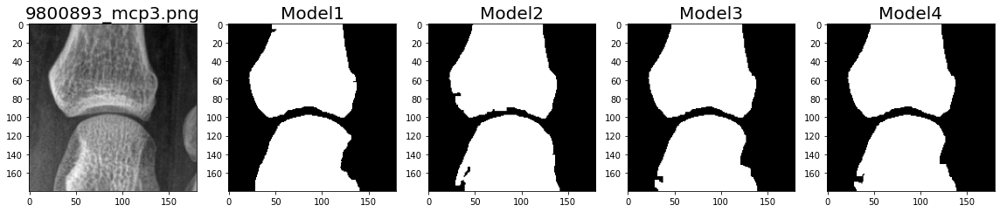

In [16]:
plt.figure(figsize=(16, 5))

pathX = 'C:\\Users\\daobr\\Documents\\CVFinal\\Final\\data\\ModelResults\\XTestFixed'
path1 = 'C:\\Users\\daobr\\Documents\\CVFinal\\\\Final\\data\\ModelResults\\First'
path2 = 'C:\\Users\\daobr\\Documents\\CVFinal\\\\Final\\data\\ModelResults\\Second'
path3 = 'C:\\Users\\daobr\\Documents\\CVFinal\\\\Final\\data\\ModelResults\\Third'
path4 = 'C:\\Users\\daobr\\Documents\\CVFinal\\\\Final\\data\\ModelResults\\Fourth'
for image in os.listdir(pathX):
    temp = []
    nameResult = image.split('.')[0] + "_pred.png"
    imagePath = os.path.join(pathX, image)
    imagePath1 = os.path.join(path1, nameResult)
    imagePath2 = os.path.join(path2, nameResult)
    imagePath3 = os.path.join(path3, nameResult)
    imagePath4 = os.path.join(path4, nameResult)
    origArray = np.asarray(PIL.Image.open(imagePath))
    array1 = np.asarray(PIL.Image.open(imagePath1))
    array2 = np.asarray(PIL.Image.open(imagePath2))
    array3 = np.asarray(PIL.Image.open(imagePath3))
    array4 = np.asarray(PIL.Image.open(imagePath4))
    temp = [origArray, array1, array2, array3, array4]
    show_image_list(list_images=temp, 
                list_titles=[image, 'Model1', 'Model2', 'Model3', 'Model4'],
                num_cols=5,
                figsize=(16, 5),
                grid=False,
                title_fontsize=20)
